# Avocado Price Prediction

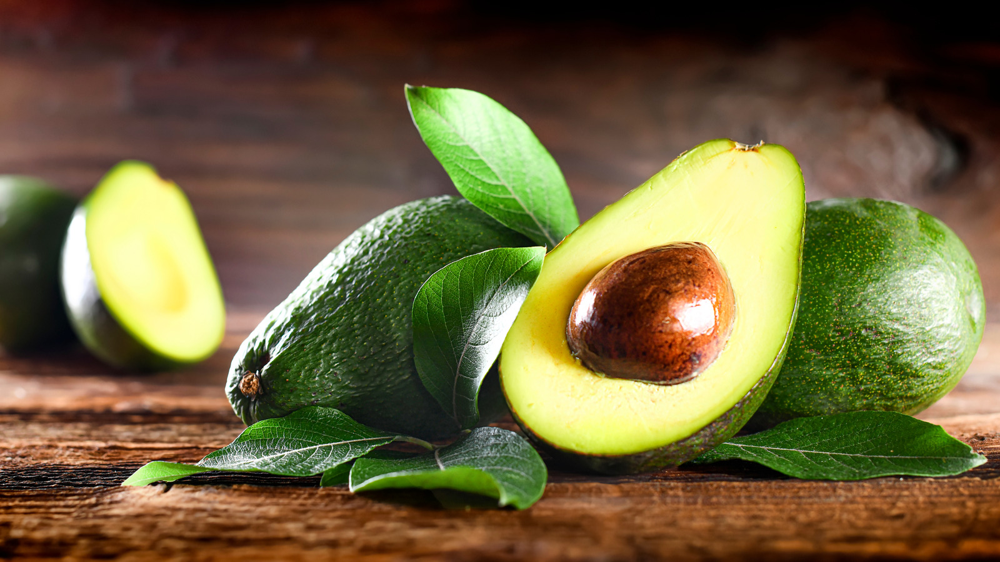

## Need Statement<br>
Dado um determinado conjunto de dados com informações de venda de abacate Hass, eu desejo criar um modelo preditivo capaz de prever o preço médio unitario do abacate Hass.<br><br>
Esses dados foram baixados do site Hass Avocado Board em maio de 2018 e compilados em um único CSV. Veja como o [Hass Avocado Board](https://hassavocadoboard.com/) descreve os dados em seu site:<br><br>
"*Os dados de varredura do varejo vêm diretamente das caixas registradoras dos varejistas com base nas vendas reais no varejo de abacates Hass. O Preço Médio (de abacates) na tabela reflete um custo por unidade (por abacate), mesmo quando várias unidades (abacates) são vendidas em sacos.*"<br>

Os dados podem ser acessados mais facilmente atraves da plataforma Kaggle: https://www.kaggle.com/datasets/neuromusic/avocado-prices?resource=download<br><br>

Descrição dos dados: <br>

<font color='#e7764e'>Date - </font>A data da observação (semanal);<br>
<font color='#e7764e'>AveragePrice - </font>O preço médio de um único abacate (target);<br>
<font color='#e7764e'>Total Volume - </font>Número total de abacates vendidos;<br>
<font color='#e7764e'>4046 - </font>Número total de abacates com PLU (Product Lookup codes) 4046 vendidos;<br>
<font color='#e7764e'>4225 - </font>Número total de abacates com PLU (Product Lookup codes) 4225 vendidos;<br>
<font color='#e7764e'>4770 - </font>Número total de abacates com  PLU (Product Lookup codes) 4770 vendidos;<br>
<font color='#e7764e'>Total Bags - </font>Total de abacates vendidos em sacos;<br>
<font color='#e7764e'>Small Bags - </font>Número de abacates vendidos em sacos pequenos;<br>
<font color='#e7764e'>Large Bags - </font>Número de abacates vendidos em sacos grandes;<br>
<font color='#e7764e'>XLarge Bags - </font>Número de abacates vendidos em sacos extragrandes;<br>
<font color='#e7764e'>type - </font>Tipo do abacate (convencional ou organico);<br>
<font color='#e7764e'>year - </font>Ano das vendas;<br>
<font color='#e7764e'>region - </font>A cidade ou região da observação.<br>

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

from fastai.tabular.core import cont_cat_split

# evidently
from evidently.dashboard import Dashboard
from evidently.dashboard.tabs import DataDriftTab, CatTargetDriftTab

## Algumas funções úteis

In [4]:
def basic_info(df:pd.DataFrame)->str:
    s = ""
    count = 1
    for c in df.columns:
        s += f"{count} - {c}\n"
        s += f"    Type: {df[c].dtype}\n"
        s += f"    No. of unique values {df[c].nunique()}\n"
        s += f"    Sample of unique values {df[c].unique()[0:10]}\n"
        s += "\n"
        count += 1
    return s

## Análise Exploratória

Carregando os dados pada um dataframe

In [5]:
df = pd.read_csv('../data/avocado.csv')

Visualizando os 5 primeiros exemplos para termos uma noção de como os dados são, e aqui ja podemos notar uma coluna inutil que contem o id das observações, vamos dropala em seguida

In [6]:
df.head(5)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [7]:
df = df.drop('Unnamed: 0', axis=1)

In [8]:
df.head(5)

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


Visualizando o shape do nosso dataframe

In [9]:
df.shape

(18249, 13)

Visualiando algumas informações basicas sobre os dados, e aqui podemos ver que não existe nenhum valor faltante no dataset, então nenhum tratamento em relação a isso precisara ser feito. O dataframe possui 4 colunas categoricas e 9 colunas continuas. Vamos separalas mais adiante para trabalharmos com elas individualmente.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


Visualizando alguns dados basicos de estatistica, como a media, desvio padrão, valor minimo e maximo e os percentils

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AveragePrice,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
Total Volume,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
4046,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
4225,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
4770,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
Total Bags,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
Small Bags,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
Large Bags,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
XLarge Bags,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65
year,18249.0,2016.147899,9.399385e-01,2015.00,2015.00,2016.00,2017.00,2018.00


Fazendo uma copia profunda do dataframe para realizarmos nossa analise exploratoria com o indice sendo a data

In [12]:
data = df.copy(deep=True)
data['Date'] = pd.to_datetime(data['Date'], format='%Y-%m-%d')
data.set_index('Date', inplace=True)

### Visualização da variavel alvo (AveragePrice)

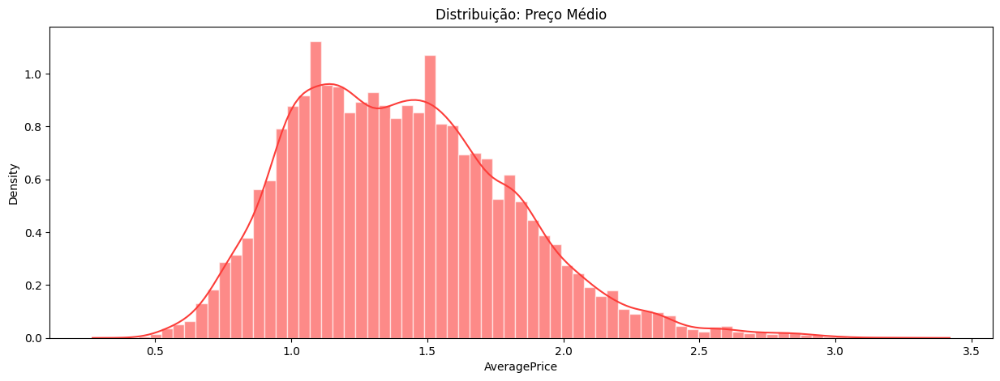

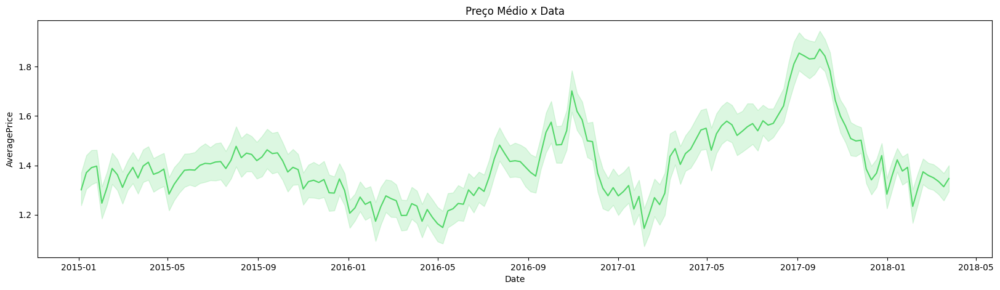

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 5))

plt.subplot(1, 1, 1)
sns.histplot(data['AveragePrice'], kde=True, kde_kws=dict(cut=3), stat='density', 
             alpha=.6, edgecolor=(1, 1, 1, .6), color='#fc3d39')
plt.title('Distribuição: Preço Médio')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 5))
plt.subplot(1, 1, 1)
sns.lineplot(data=data, x=data.index, y='AveragePrice', color='#53d769')
plt.title('Preço Médio x Data')

plt.show()
fig.tight_layout()

A distribuição de AveragePrice é praticamente uma curva normalmente distribuída. Ela destaca pequenos picos duplos, mas não tem problema.
Podemos observar claramente uma tendência positiva do preço em relação a data. Podem ser observados 3 picos repetitivos em intervalos de tempo consistentes. O preço cai por volta dos meses de dezembro/janeiro e sobe para seu valor mais alto nos meses de setembro a novembro.

### Dividindo features em numéricos e categóricos

Serapando os dados em categorico e continuos, para uma analise separada de ambos os tipos.

In [14]:
cont_col, cat_col = cont_cat_split(data)
print(f'Continuous Columns: {cont_col}\n')
print(f'Categorical Columns: {cat_col}')

Continuous Columns: ['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags']

Categorical Columns: ['type', 'year', 'region']


In [15]:
cont_col.remove('AveragePrice')
cat_col.remove('region')

Removendo o AveragePrice e o year pois seram analisados separadamente

### Features Categóricas

#### Distribuição das features categóricas

In [16]:
data['type'] = data['type'].map({'conventional': 1, 'organic': 0})

Convertendo os valores da feature type para facilitar as plotagens, ficando então conventional(1) e organic(0)

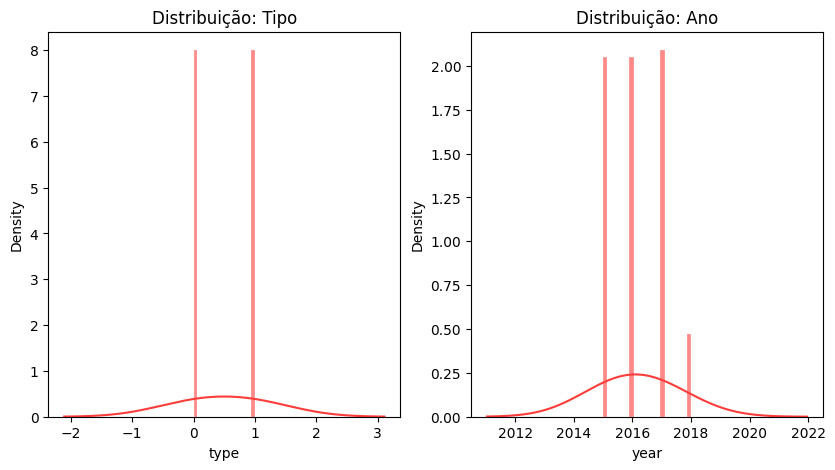

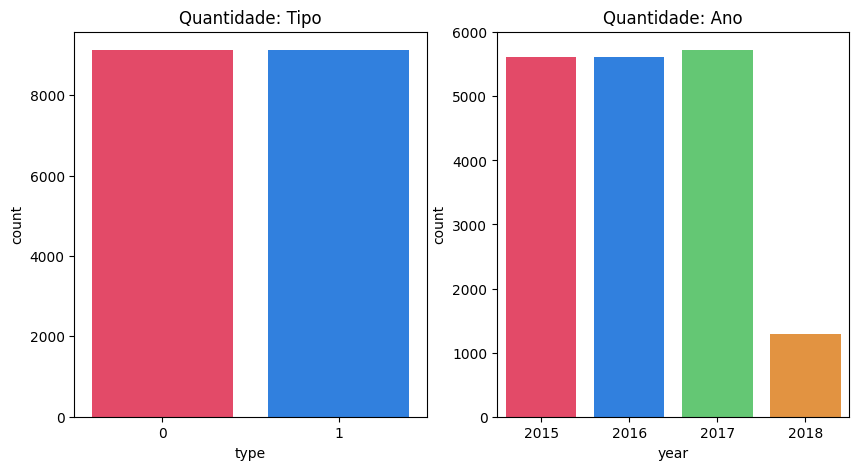

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
for i in range(len(cat_col)):
    plt.subplot(1, 2, i+1)
    sns.histplot(data[cat_col[i]], kde=True, kde_kws=dict(cut=3, bw_adjust=10), stat='density', 
                 alpha=.6, edgecolor=(1, 1, 1, .6), color='#fc3d39')
    title = f'Distribuição: {"Tipo" if cat_col[i] == "type" else "Ano"}'
    plt.title(title)
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
for i in range(len(cat_col)):
    plt.subplot(1, 2, i+1)
    sns.countplot(x=data[cat_col[i]], palette=['#fc3158','#147efb', '#53d769', '#fd9426'])
    title = f'Quantidade: {"Tipo" if cat_col[i] == "type" else "Ano"}'
    plt.title(title)

Ambos as features são normalmente distribuídas. Abacates convencionais e orgânicos estão presentes na mesma quantidade. Da mesma forma, a quantidade de dados são praticamente os mesmos para os anos de 2015, 2016, 2017, seguido por uma queda muito acentuada em 2018, provavelmente por não haver mais dados em 2018 ou por ser o ano em que os dados foram coletados, talvez o ano não tivesse sido finalizao ainda.

In [18]:
data['region'].value_counts()

Albany                 338
Sacramento             338
Northeast              338
NorthernNewEngland     338
Orlando                338
Philadelphia           338
PhoenixTucson          338
Pittsburgh             338
Plains                 338
Portland               338
RaleighGreensboro      338
RichmondNorfolk        338
Roanoke                338
SanDiego               338
Atlanta                338
SanFrancisco           338
Seattle                338
SouthCarolina          338
SouthCentral           338
Southeast              338
Spokane                338
StLouis                338
Syracuse               338
Tampa                  338
TotalUS                338
West                   338
NewYork                338
NewOrleansMobile       338
Nashville              338
Midsouth               338
BaltimoreWashington    338
Boise                  338
Boston                 338
BuffaloRochester       338
California             338
Charlotte              338
Chicago                338
C

A feature região também possui uma distribuição normal, com os dados perfeitamente balanceados, todas regiões aparecem 338 vezes.

#### Features Categóricas x Variável Alvo (AveragePrice)

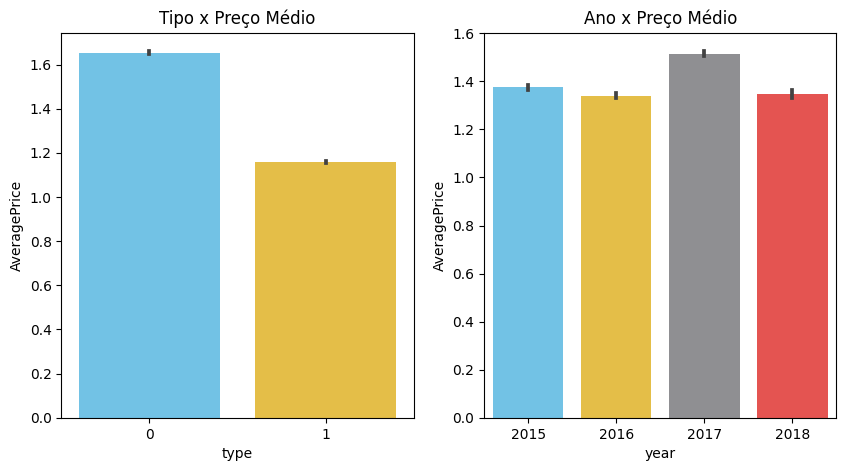

In [19]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
for i in range(len(cat_col)):
    plt.subplot(1, 2, i+1)
    sns.barplot(data=data, x=cat_col[i], y='AveragePrice', palette=['#5fc9f8','#fecb2e', '#8e8e93', '#fc3d39'])
    title = f'{"Tipo" if cat_col[i] == "type" else "Ano"} x Preço Médio'
    plt.title(title);

O preço médio do abacate convencional(1) é menor que o do orgânico(0). O preço médio dos abacates é quase o mesmo para os anos de 2015, 2016 e 2018. Um aumento no preço médio pode claramente ser visto no ano de 2017.

### Features Numéricas

#### Distribuição das features numéricas

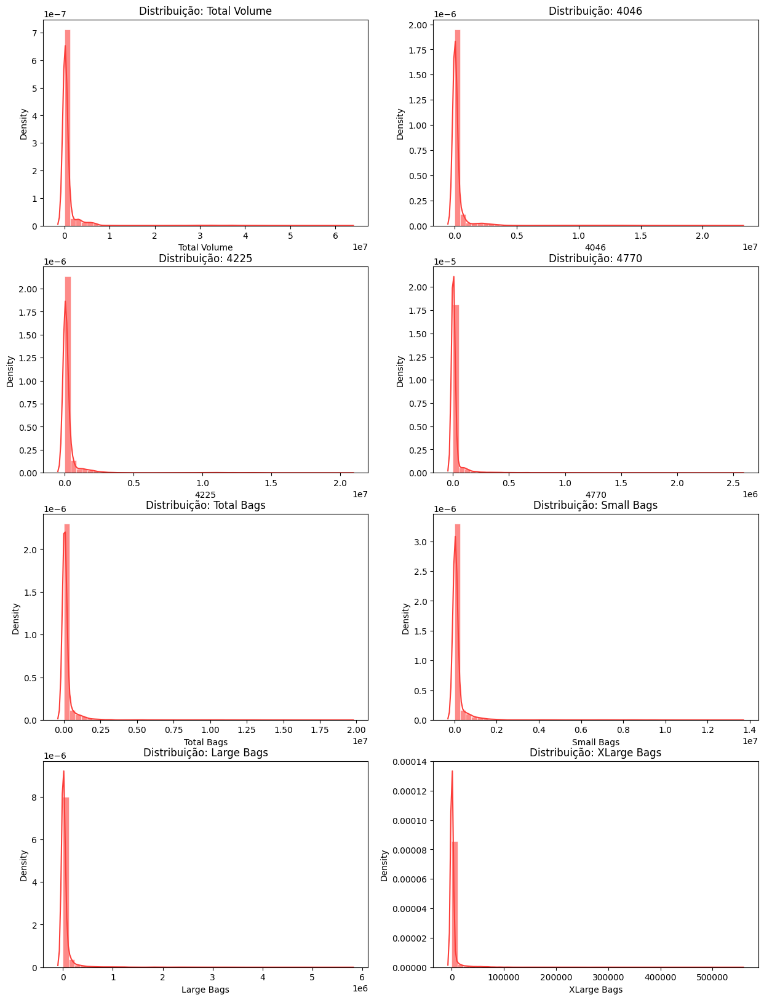

In [20]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
for i in range(len(cont_col)):
    plt.subplot(4, 2, i+1)
    sns.histplot(data[cont_col[i]], kde=True, kde_kws=dict(cut=3), stat='density', bins=50, 
                 alpha=.6, edgecolor=(1, 1, 1, .6), color='#fc3d39')
    title = 'Distribuição: ' + cont_col[i]
    plt.title(title)
plt.show()
fig.tight_layout()

A visualização fica dificil, pois alem dos valores serem muito altos, ainda estão em grande variedade, com muitos valores unicos. Mas ainda se pode notar que todas as features estão com um forte enviesamento a esquerda, demostrando que a grande maioria dos dados são de valores menores.

#### Features Numéricas x Features Categóricas

##### Features numéricas x Tipo

In [21]:
total_volume = [sum(data[data['type'] == 0]['Total Volume']) / sum(data['Total Volume']) * 100, 
                sum(data[data['type'] == 1]['Total Volume']) / sum(data['Total Volume']) * 100]

avocado_4046 = [sum(data[data['type'] == 0]['4046']) / sum(data['4046']) * 100, 
                sum(data[data['type'] == 1]['4046']) / sum(data['4046']) * 100]

avocado_4225 = [sum(data[data['type'] == 0]['4225']) / sum(data['4225']) * 100, 
                sum(data[data['type'] == 1]['4225']) / sum(data['4225']) * 100]

avocado_4770 = [sum(data[data['type'] == 0]['4770']) / sum(data['4770']) * 100, 
                sum(data[data['type'] == 1]['4770']) / sum(data['4770']) * 100]

total_bags = [sum(data[data['type'] == 0]['Total Bags']) / sum(data['Total Bags']) * 100, 
              sum(data[data['type'] == 1]['Total Bags']) / sum(data['Total Bags']) * 100]

small_bags = [sum(data[data['type'] == 0]['Small Bags']) / sum(data['Small Bags']) * 100, 
              sum(data[data['type'] == 1]['Small Bags']) / sum(data['Small Bags']) * 100]

large_bags = [sum(data[data['type'] == 0]['Large Bags']) / sum(data['Large Bags']) * 100, 
              sum(data[data['type'] == 1]['Large Bags']) / sum(data['Large Bags']) * 100]

xlarge_bags = [sum(data[data['type'] == 0]['XLarge Bags']) / sum(data['XLarge Bags']) * 100, 
               sum(data[data['type'] == 1]['XLarge Bags']) / sum(data['XLarge Bags']) * 100]

type_n_features_per = [total_volume, avocado_4046, avocado_4225, avocado_4770, total_bags, small_bags, 
                       large_bags, xlarge_bags]

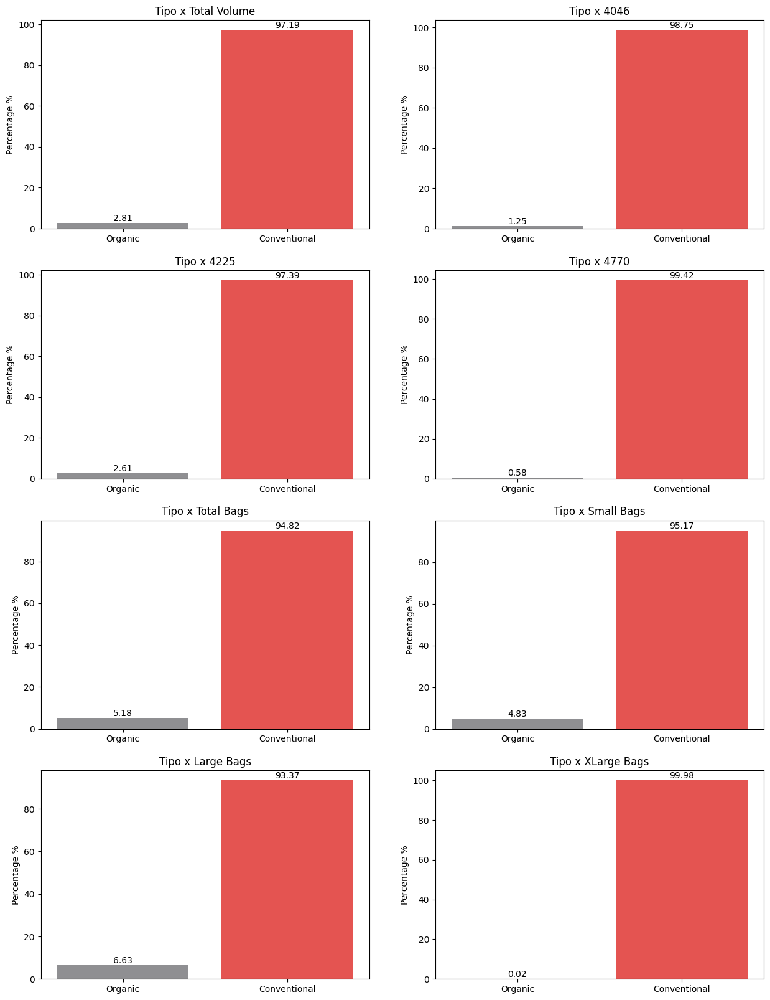

In [22]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
for i in range(len(cont_col)):
    plt.subplot(4, 2, i+1)
    ax = sns.barplot(x=['Organic', 'Conventional'], y=type_n_features_per[i], palette=['#8e8e93', '#fc3d39'])
    ax.bar_label(ax.containers[0], fmt='%.2f')
    ax.set(ylabel='Percentage %')
    title = f'Tipo x {cont_col[i]}'
    plt.title(title)

A venda de abacates convencionais domina por uma margem enorme a venda de abacates orgânicos para todas as features numéricas.

##### Features numéricas x Ano

In [23]:
total_volume = [sum(data[data['year'] == 2015]['Total Volume']) / sum(data['Total Volume']) * 100,
                sum(data[data['year'] == 2016]['Total Volume']) / sum(data['Total Volume']) * 100,
                sum(data[data['year'] == 2017]['Total Volume']) / sum(data['Total Volume']) * 100,
                sum(data[data['year'] == 2018]['Total Volume']) / sum(data['Total Volume']) * 100]

avocado_4046 = [sum(data[data['year'] == 2015]['4046']) / sum(data['4046']) * 100,
                sum(data[data['year'] == 2016]['4046']) / sum(data['4046']) * 100,
                sum(data[data['year'] == 2017]['4046']) / sum(data['4046']) * 100,
                sum(data[data['year'] == 2018]['4046']) / sum(data['4046']) * 100]

avocado_4225 = [sum(data[data['year'] == 2015]['4225']) / sum(data['4225']) * 100,
                sum(data[data['year'] == 2016]['4225']) / sum(data['4225']) * 100,
                sum(data[data['year'] == 2017]['4225']) / sum(data['4225']) * 100,
                sum(data[data['year'] == 2018]['4225']) / sum(data['4225']) * 100]

avocado_4770 = [sum(data[data['year'] == 2015]['4770']) / sum(data['4770']) * 100,
                sum(data[data['year'] == 2016]['4770']) / sum(data['4770']) * 100,
                sum(data[data['year'] == 2017]['4770']) / sum(data['4770']) * 100,
                sum(data[data['year'] == 2018]['4770']) / sum(data['4770']) * 100]

total_bags = [sum(data[data['year'] == 2015]['Total Bags']) / sum(data['Total Bags']) * 100,
              sum(data[data['year'] == 2016]['Total Bags']) / sum(data['Total Bags']) * 100,
              sum(data[data['year'] == 2017]['Total Bags']) / sum(data['Total Bags']) * 100,
              sum(data[data['year'] == 2018]['Total Bags']) / sum(data['Total Bags']) * 100]

small_bags = [sum(data[data['year'] == 2015]['Small Bags']) / sum(data['Small Bags']) * 100,
              sum(data[data['year'] == 2016]['Small Bags']) / sum(data['Small Bags']) * 100,
              sum(data[data['year'] == 2017]['Small Bags']) / sum(data['Small Bags']) * 100,
              sum(data[data['year'] == 2018]['Small Bags']) / sum(data['Small Bags']) * 100]

large_bags = [sum(data[data['year'] == 2015]['Large Bags']) / sum(data['Large Bags']) * 100,
              sum(data[data['year'] == 2016]['Large Bags']) / sum(data['Large Bags']) * 100,
              sum(data[data['year'] == 2017]['Large Bags']) / sum(data['Large Bags']) * 100,
              sum(data[data['year'] == 2018]['Large Bags']) / sum(data['Large Bags']) * 100]

xlarge_bags = [sum(data[data['year'] == 2015]['XLarge Bags']) / sum(data['XLarge Bags']) * 100,
               sum(data[data['year'] == 2016]['XLarge Bags']) / sum(data['XLarge Bags']) * 100,
               sum(data[data['year'] == 2017]['XLarge Bags']) / sum(data['XLarge Bags']) * 100,
               sum(data[data['year'] == 2018]['XLarge Bags']) / sum(data['XLarge Bags']) * 100]

year_n_features_per = [total_volume, avocado_4046, avocado_4225, avocado_4770, total_bags, 
                       small_bags, large_bags, xlarge_bags]

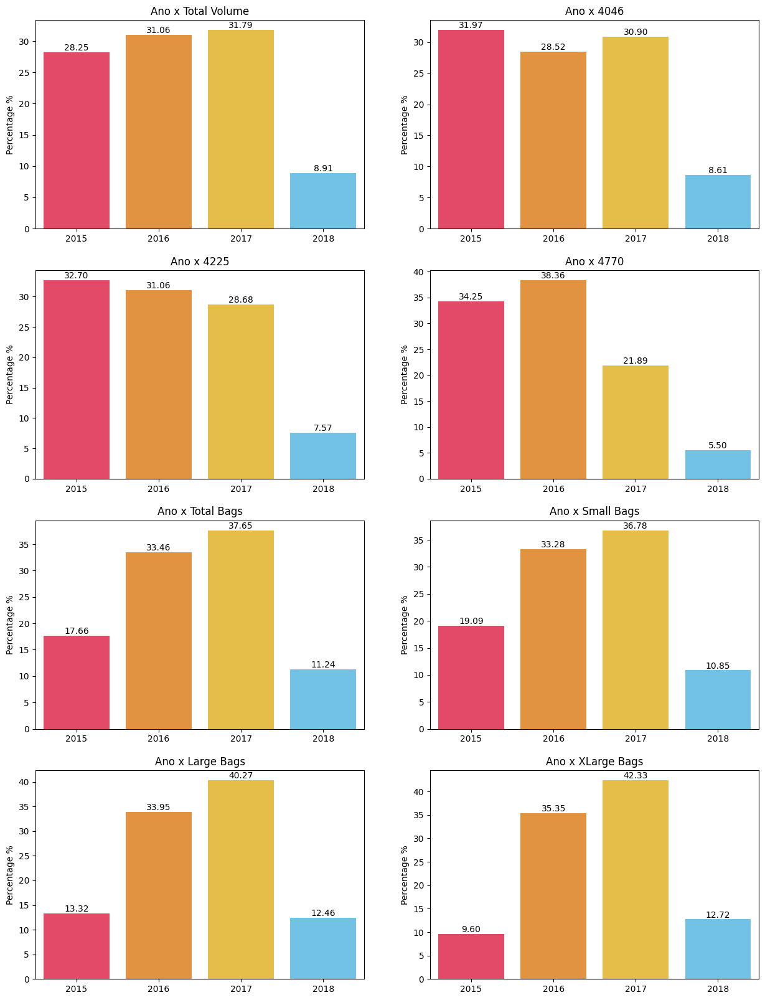

In [24]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
for i in range(len(cont_col)):
    plt.subplot(4, 2, i+1)
    ax = sns.barplot(x=['2015', '2016', '2017', '2018'], y=year_n_features_per[i], 
                     palette=['#fc3158', '#fd9426', '#fecb2e', '#5fc9f8'])
    ax.bar_label(ax.containers[0], fmt='%.2f')
    ax.set(ylabel='Percentage %')
    title = f'Ano x {cont_col[i]}'
    plt.title(title)

O volume total de abacates aumentou ano a ano a partir de 2015. Os valores para o ano de 2018 são baixos porque os dados registrados são dos primeiros 3 meses de 2018. Em 2015, todos os 3 tipos de abacate, 4046, 4225, 4770, são vendidos em quantidades quase iguais. No entanto, em 2016, nota-se uma preferência pelo abacate tipo 4770, com 38,4% das vendas, seguido por 4225 e 4046, respectivamente. No caso dos sacos, observa-se um crescimento crescente das vendas a partir de 2015. Observa-se um crescimento concreto nas vendas sacos de 2015 a 2016 por uma margem de 19%.

#### Features numéricas x Data

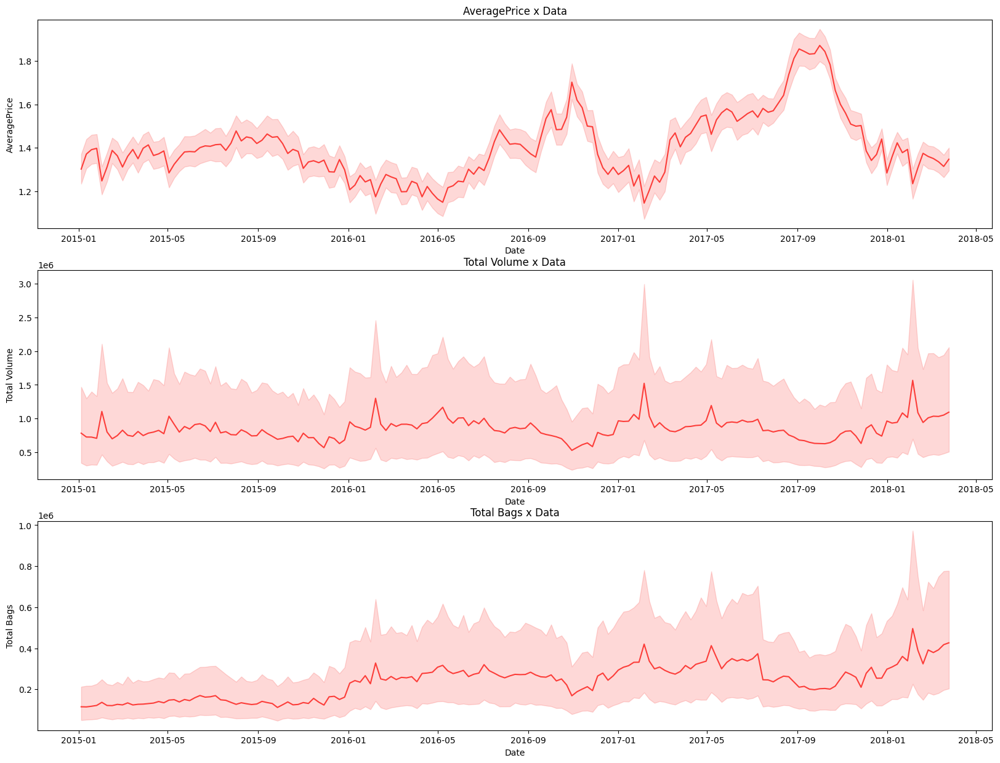

In [25]:
ft = ['AveragePrice', 'Total Volume', 'Total Bags']
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 15))
for i in range(len(ft)):
    plt.subplot(3, 1, i+1)
    sns.lineplot(data=data, x=data.index, y=ft[i], color='#fc3d39')
    title = f'{ft[i]} x Data'
    plt.title(title)

A partir dos gráficos acima, podemos dizer que o preço médio x volume total e total de sacos estão negativamente correlacionados ou se complementam. O preço médio é inversamente proporcional ao volume total e total de sacos, enquanto o volume total exibe uma relação diretamente proporcional com o total de sacos. Esta relação entre preço médio x volume total e total de sacos e, relação a data pode ser associada à Lei da Oferta e Demanda. Se a oferta aumentar e a demanda permanecer a mesma, o preço cairá. Se a oferta diminuir e a demanda permanecer a mesma, o preço aumentará.

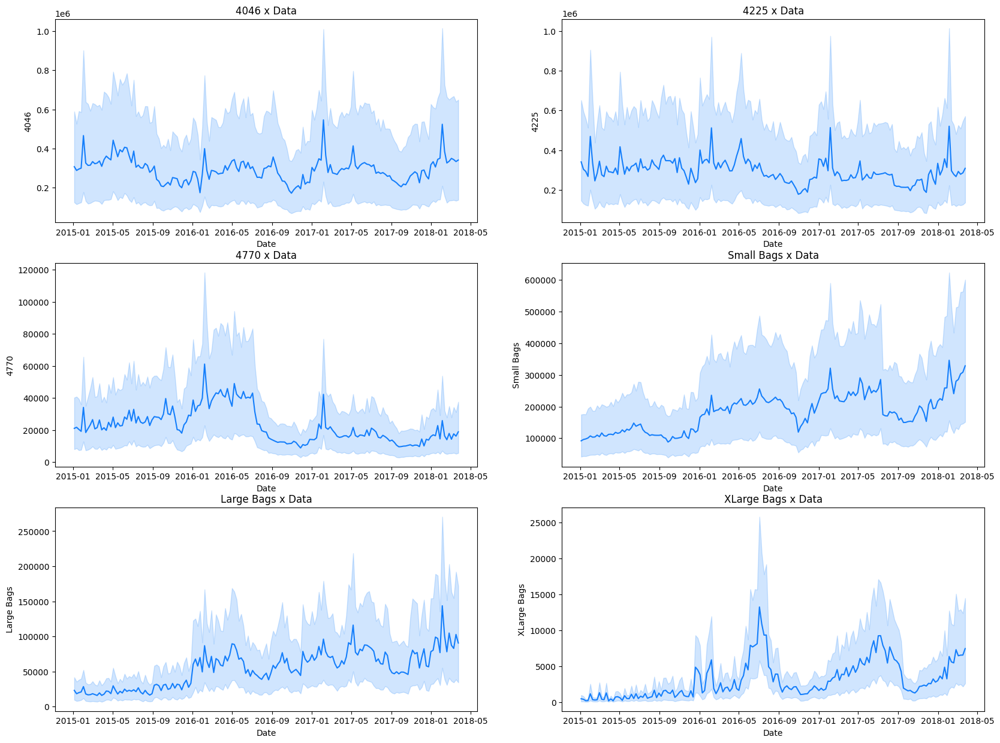

In [26]:
ft = ['4046','4225','4770','Small Bags','Large Bags','XLarge Bags']
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))
for i in range(len(ft)):
    plt.subplot(3, 2, i+1)
    sns.lineplot(data=data, x=data.index, y=ft[i], color='#147efb')
    title = f'{ft[i]} x Data'
    plt.title(title)

Os abacates com PLU (Product Lookup Code) 4046 e 4225 exibem os mesmos padrões de acordo com a data. O tipo 4770 de abacate sofreu uma diminuição nas suas vendas com o passar do tempo. O uso de sacos com abacates definitivamente está em alta! Todos os sacos exibem um gráfico crescente com a data. Dos valores presentes no eixo y, os varejistas preferem as sacolas pequenas.

#### Correlação entre as features numéricas

<AxesSubplot: >

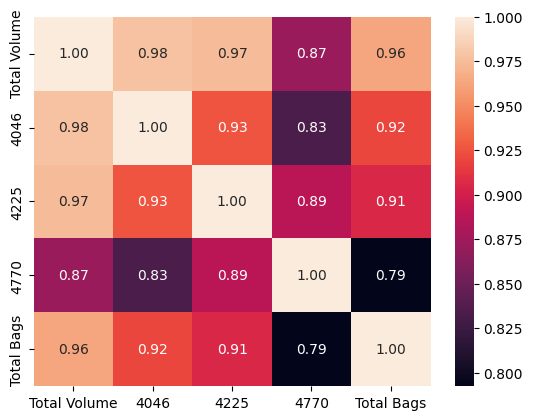

In [27]:
sns.heatmap(abs(data[['Total Volume', '4046', '4225', '4770', 'Total Bags']].corr()), fmt='.2f', annot=True)

Olhando a correlação entre essas features numéricas, podemos notar uma forte relação entre elas, o que é explicado pelo fato da feature Total Volume ser uma soma das demais features.

<AxesSubplot: >

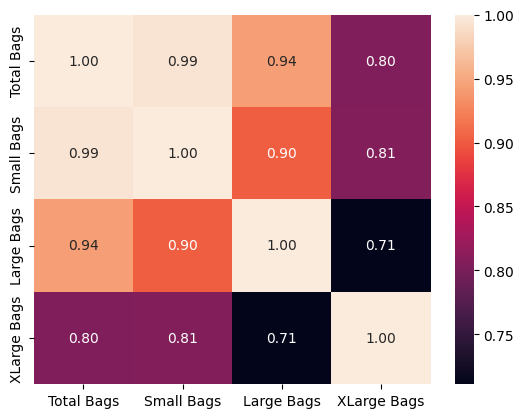

In [28]:
sns.heatmap(abs(data[['Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags']].corr()), fmt='.2f', annot=True)

Fazendo a mesma coisa para as features relacionadas as vendas em sacos, tambem notados a alta correlação entre elas, devido ao fato da feature Total Bags representar a soma das outras três.

## Engenharia de Feature

### Features categoricas

In [29]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df.insert(10, 'mounth', df['Date'].dt.strftime('%m'), True)
df.insert(11, 'day', df['Date'].dt.strftime('%d'), True)

Extraindo o dia e o mês da feature date, criando novas features representando o dia e o mês.

In [30]:
df = df.drop('Date', axis=1)

Dropando a feature Date pois ja foi expandida para novas features.

In [31]:
df['type'] = df['type'].map({'conventional': 1, 'organic': 0})

Convertendo os valores da feature type para valores numericos binarios, conventional = 1, organic = 0

In [32]:
df = df[~df['region'].isin(['Northeast', 'Southeast', 'TotalUS', 'West', 'Midsouth'])]

Dropando alguns valores da feature region, pois representam um aglomerado de regiões, como Northeast, Southeast, TotalUs, West e Midsouth, não queremos esses grupos de regiões poes carregam informações repetidas que ja se encontram nas regiões individuais.

In [33]:
df = pd.concat([df, pd.get_dummies(df['region'])], axis=1)

Transformando os valores da feature região em novas features, cada uma delas ira receber um valor binario, 1 para caso a observação tenha sido registrado na região, 0 caso contrario.

In [34]:
df.columns

Index(['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'mounth', 'day', 'type',
       'year', 'region', 'Albany', 'Atlanta', 'BaltimoreWashington', 'Boise',
       'Boston', 'BuffaloRochester', 'California', 'Charlotte', 'Chicago',
       'CincinnatiDayton', 'Columbus', 'DallasFtWorth', 'Denver', 'Detroit',
       'GrandRapids', 'GreatLakes', 'HarrisburgScranton',
       'HartfordSpringfield', 'Houston', 'Indianapolis', 'Jacksonville',
       'LasVegas', 'LosAngeles', 'Louisville', 'MiamiFtLauderdale',
       'Nashville', 'NewOrleansMobile', 'NewYork', 'NorthernNewEngland',
       'Orlando', 'Philadelphia', 'PhoenixTucson', 'Pittsburgh', 'Plains',
       'Portland', 'RaleighGreensboro', 'RichmondNorfolk', 'Roanoke',
       'Sacramento', 'SanDiego', 'SanFrancisco', 'Seattle', 'SouthCarolina',
       'SouthCentral', 'Spokane', 'StLouis', 'Syracuse', 'Tampa',
       'WestTexNewMexico'],
      dtype='object')

In [35]:
df = df.drop('region', axis=1)

### Features numéricas

In [36]:
df = df.drop(columns=['Total Volume', 'Total Bags'], axis=1)

Dropando as features que possuem o valor total da soma das demais features pois possuem uma grande correlação e representam os mesmos dados.

In [37]:
df = df.rename(columns={'4046': 'PLU4046', '4225': 'PLU4225', '4770': 'PLU4770', 'Small Bags': 'SmallBags', 
                        'Large Bags': 'LargeBags', 'XLarge Bags': 'XLargeBags'}, errors='raise')

In [38]:
df.head(5)

,AveragePrice,PLU4046,PLU4225,PLU4770,SmallBags,LargeBags,XLargeBags,mounth,day,type,...,SanDiego,SanFrancisco,Seattle,SouthCarolina,SouthCentral,Spokane,StLouis,Syracuse,Tampa,WestTexNewMexico
0,1.33,1036.74,54454.85,48.16,8603.62,93.25,0.0,12,27,1,...,0,0,0,0,0,0,0,0,0,0
1,1.35,674.28,44638.81,58.33,9408.07,97.49,0.0,12,20,1,...,0,0,0,0,0,0,0,0,0,0
2,0.93,794.70,109149.67,130.50,8042.21,103.14,0.0,12,13,1,...,0,0,0,0,0,0,0,0,0,0
3,1.08,1132.00,71976.41,72.58,5677.40,133.76,0.0,12,06,1,...,0,0,0,0,0,0,0,0,0,0
4,1.28,941.48,43838.39,75.78,5986.26,197.69,0.0,11,29,1,...,0,0,0,0,0,0,0,0,0,0


## Preparação dos dados

### Train and test split (70% / 30%)

Definindo os dados de treino e teste

In [39]:
X = df.drop(columns=['AveragePrice'])    # input
y = df['AveragePrice']    # output

# split the data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'-' * 27)
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (11591, 59)
y_train shape: (11591,)
---------------------------
X_test shape: (4968, 59)
y_test shape: (4968,)


### Data Drift / Target Drift

In [40]:
dashboard = Dashboard(tabs=[DataDriftTab(verbose_level=0)])
dashboard.calculate(X_train, X_test, column_mapping=None)
dashboard.show(mode='inline')

Nas variaveis de entradas não foi encontrado nenhum drift.

In [41]:
y_train_target = pd.DataFrame()
y_train_target['target'] = y_train

y_test_target = pd.DataFrame()
y_test_target['target'] = y_test

dashboard = Dashboard(tabs=[CatTargetDriftTab(verbose_level=0)])
dashboard.calculate(y_train_target, y_test_target)
dashboard.show(mode='inline')

Já na variável alvo foi encontrado um pequeno drift entre os valores de 1.5 ate 1.99, onde nosso dado de test esta um pouco mais alto que o dado de referência, com uma diferença de 0.10.

Salvando os dados em arquivos csv

In [42]:
X_train.to_csv('../data/X_train.csv', index=False)
y_train.to_csv('../data/y_train.csv', index=False)

X_test.to_csv('../data/X_test.csv', index=False)
y_test.to_csv('../data/y_test.csv', index=False)